In [67]:
import numpy as np
import pandas as pd
import random
import os
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sb
import torch
from torchsummary import summary
from torchvision import models
from torch import nn
from torch import optim
from torch.optim import lr_scheduler
from torch.utils.data import Subset
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.models.vision_transformer import vit_b_16, ViT_B_16_Weights
from torchvision.utils import make_grid
from torch.autograd import Variable
import torch.optim.lr_scheduler as lr_scheduler
from tqdm import tqdm
from sklearn.metrics import f1_score, accuracy_score, precision_recall_fscore_support
import shutil
import warnings
warnings.filterwarnings("ignore")

code_dir = '/kaggle/working/'
model_dir = '/kaggle/working/model'
output_dir = '/kaggle/working/output'

if not os.path.exists(code_dir):
    os.mkdir(code_dir)

if not os.path.exists(model_dir):
    os.mkdir(model_dir)

if not os.path.exists(output_dir):
    os.mkdir(output_dir)


In [68]:
import os

base_path = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake"
print(os.listdir(base_path))


['valid', 'test', 'train']


In [69]:
def ViT_model():
    model_vit=vit_b_16(pretrained=True)
    return model_vit

In [70]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [71]:
device

device(type='cuda')

In [72]:
import torch.nn as nn

criterion = nn.CrossEntropyLoss()

In [73]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

In [74]:
local_archive="/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake"

In [75]:
def train_data_transform(model_type, data_fraction, batch_size):
    if model_type == 'vit':
        mean = [0.485, 0.456, 0.406]
        std = [0.229, 0.224, 0.225]

        transform = transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomRotation(20),
            transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
            transforms.ToTensor(),
            transforms.Normalize(mean=mean, std=std)
        ])

    full_train_dataset = ImageFolder("/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/train", transform=transform)
    num_train_data = int(len(full_train_dataset) * data_fraction)
    train_indices = random.sample(range(len(full_train_dataset)), num_train_data)
    train_dataset = torch.utils.data.Subset(full_train_dataset, train_indices)
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    return train_dataloader

In [76]:
def val_data_transform(model_type, data_fraction, batch_size):
    if model_type == 'vit':
        transform = ViT_B_16_Weights.IMAGENET1K_V1.transforms()
    
    full_valid_dataset = ImageFolder("/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid", transform=transform)

    num_valid_data = int(len(full_valid_dataset) * data_fraction)
    random.seed(42)  # For reproducibility
    valid_indices = random.sample(range(len(full_valid_dataset)), num_valid_data)

    valid_dataset = torch.utils.data.Subset(full_valid_dataset, valid_indices)

    val_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

    return val_dataloader

In [77]:
def test_data_transform(model_type, data_fraction, batch_size):     
    if model_type == 'vit':
        transform = ViT_B_16_Weights.IMAGENET1K_V1.transforms()
    
    full_test_dataset = ImageFolder("/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/test", transform=transform)

    num_test_data = int(len(full_test_dataset) * data_fraction)

    test_indices = random.sample(range(len(full_test_dataset)), num_test_data)

    test_dataset = torch.utils.data.Subset(full_test_dataset, test_indices)

    test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return test_dataloader

In [78]:
def train(model_type, exp, model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, device, num_epochs, ft=False, patience=2):
    best_f1 = 0
    trigger_times = 0
    all_metrics = []  # Store metrics per epoch

    for epoch in range(num_epochs):  # This is the epoch loop
        train_loss, train_accuracy, train_f1 = 0.0, 0.0, 0.0
        val_loss, val_accuracy, val_f1 = 0.0, 0.0, 0.0
        found_encoder = False
        # === FREEZE / UNFREEZE ===
        if not ft:
            for name, param in model.named_parameters():
                if "encoder.layers.encoder_layer_" in name:
                    found_encoder = True
                    try:
                        layer_str = name.split('encoder_layer_')[1].split('.')[0]
                        layer_num = int(layer_str)
                        if layer_num < 5:
                            param.requires_grad = False
                    except (IndexError, ValueError):
                        continue
                        
            #Fallback- Freeze all layers if no encoder layers found
            if not found_encoder:
                print("Freezing all layer")
                for param in model.parameters():
                    param.requires_grad = False
                    
            if hasattr(model, 'heads'):
                for param in model.heads.parameters():
                    param.requires_grad = True
            elif hasattr(model, 'classifier'):
                for param in model.classifier.parameters():
                    param.requires_grad = True
            else:
                raise ValueError("Model head not found.")
        else:
            for param in model.parameters():
                param.requires_grad = True

        # === TRAINING ===
        model.train()
        running_loss = 0.0
        y_true_train, y_pred_train = [], []

        loop = tqdm(enumerate(train_dataloader), total=len(train_dataloader), desc=f"Epoch [{epoch+1}/{num_epochs}]")

        for batch_idx, (images, labels) in loop:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            predicted = outputs.argmax(dim=1)
            y_true_train.extend(labels.cpu().tolist())
            y_pred_train.extend(predicted.cpu().tolist())
            loop.set_postfix(loss=loss.item())

        if scheduler:
            scheduler.step()

        train_loss = running_loss / len(train_dataloader.dataset)
        train_accuracy = accuracy_score(y_true_train, y_pred_train)
        _, _, train_f1, _ = precision_recall_fscore_support(y_true_train, y_pred_train, average='macro', zero_division=0)
        print(f"Train Loss: {train_loss:.6f} | Acc: {train_accuracy*100:.2f}% | F1: {train_f1:.6f}")

        # === VALIDATION ===
        model.eval()
        y_true_val, y_pred_val = [], []
        val_running_loss = 0.0

        with torch.no_grad():
            for images, labels in val_dataloader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_running_loss += loss.item()

                predicted = outputs.argmax(dim=1)
                y_true_val.extend(labels.cpu().tolist())
                y_pred_val.extend(predicted.cpu().tolist())

        val_loss = val_running_loss / len(val_dataloader.dataset)
        val_accuracy = accuracy_score(y_true_val, y_pred_val)
        _, _, val_f1, _ = precision_recall_fscore_support(y_true_val, y_pred_val, average='macro', zero_division=0)

        print(f"Val Loss: {val_loss:.6f} | Acc: {val_accuracy*100:.2f}% | F1: {val_f1:.6f}")

        # === EARLY STOPPING ===
        if val_f1 > best_f1:
            best_f1 = val_f1
            trigger_times = 0
            best_model_path = os.path.join(model_dir, f'best_model_{model_type}_exp_{exp}.pth')
            torch.save(model.state_dict(), best_model_path)
            print(f"✅ Model saved at {best_model_path}")
        else:
            trigger_times += 1
            print(f"⚠️ No improvement. Patience: {trigger_times}/{patience}")
            if trigger_times >= patience:
                print("⛔ Early stopping triggered.")
                break

        # Store metrics per epoch
        all_metrics.append({
            'epoch': epoch + 1,
            'train_loss': train_loss,
            'train_accuracy': train_accuracy,
            'train_f1': train_f1,
            'val_loss': val_loss,
            'val_accuracy': val_accuracy,
            'val_f1': val_f1
        })

    # Save metrics to CSV after the last epoch
    df = pd.DataFrame(all_metrics)
    df.to_csv('metrics.csv', index=False)

    return train_loss, train_accuracy, train_f1, val_loss, val_accuracy, val_f1


In [79]:
import torch.nn.functional as F
def test(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    y_pred = []
    y_true = []
    #y_pred_probs = []  # To store predicted probabilities

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)  # Get raw logits from the model

            # Compute loss
            loss = criterion(outputs, labels)
            running_loss += loss.item()

            # Get predicted class (argmax for classification)
            predicted = outputs.argmax(dim=1)

            # Append to y_true and y_pred
            y_true.extend(labels.cpu().tolist())
            y_pred.extend(predicted.cpu().tolist())

            # Update correct and total for accuracy calculation
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
              
    test_loss = running_loss / len(list(dataloader.dataset))
    test_accuracy = accuracy_score(y_true, y_pred)
    precision, recall, test_f1, _ = precision_recall_fscore_support(y_true, y_pred, average='macro',zero_division=0)

    print(f"Test Loss: {test_loss:.6f} | Test Accuracy: {(test_accuracy * 100):.2f}% | Test F1-Score: {test_f1:.6f}")
    return test_loss, test_accuracy, test_f1, y_pred, y_true

In [80]:
def train_model(model_type, data_fraction, num_epochs=10, batch_size=32, learning_rate=0.0001):

    # Initialize metrics
    train_loss = []
    train_accuracy = []
    val_loss = []
    val_accuracy = []
    val_f1 = []

    num_classes = 2
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Dataset info for logging
    num_train_data = int(100000 * data_fraction)
    num_valid_data = int(20000 * data_fraction)
    print(f"Training samples: {num_train_data}")
    print(f"Validation samples: {num_valid_data}")
    print("====================Starting==================================")

    # Load data
    train_dataloader = train_data_transform(model_type, data_fraction, batch_size)
    val_dataloader = val_data_transform(model_type, data_fraction, batch_size)
    
    # === MODEL SETUP ===
    if model_type == 'vit':
        model = ViT_model()
        #uncomment if you are using all layers freezing technique
        model.heads=nn.Linear(768,2)

        #comment if you are using freezing technique
        #model.head = nn.Sequential(
         #   nn.Linear(768, 512),   # First linear layer
          #  nn.ReLU(),
           # nn.Dropout(p=0.3),     # Dropout with a rate of 0.3
            #nn.Linear(512, num_classes)  # Final classification layer
        #)
    #else:
     #   raise ValueError("Unsupported model_type. Extend logic for other models.")

    model = model.to(device)
    num=10
    # === LOSS, OPTIMIZER, SCHEDULER ===
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    # === TRAINING ===
    print(f"Experiment: {model_type.upper()} with Fine-Tuning")

    train_loss, train_accuracy, train_f1, val_loss, val_accuracy, val_f1 = train(
        model_type=model_type,
        exp=2,
        model=model,
        train_dataloader=train_dataloader,
        val_dataloader=val_dataloader,
        criterion=criterion,
        optimizer=optimizer,
        scheduler=scheduler,
        device=device,
        num_epochs=num_epochs,
        ft = False, patience=3)

    return train_loss, train_accuracy, train_f1, val_loss, val_accuracy, val_f1


In [81]:



train_loss, train_accuracy, train_f1, val_loss, val_accuracy,val_f1 = train_model('vit',1, num_epochs=10, batch_size=32, learning_rate=1e-4)

Using device: cuda
Training samples: 100000
Validation samples: 20000
====================Starting==================================


Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:01<00:00, 235MB/s] 


Experiment: VIT with Fine-Tuning


Epoch [1/10]: 100%|██████████| 3125/3125 [46:48<00:00,  1.11it/s, loss=0.396]  

Train Loss: 0.004955 | Acc: 93.39% | F1: 0.933860


Val Loss: 0.002157 | Acc: 97.32% | F1: 0.973240
✅ Model saved at /kaggle/working/model/best_model_vit_exp_2.pth


Epoch [2/10]: 100%|██████████| 3125/3125 [36:57<00:00,  1.41it/s, loss=0.00266] 

Train Loss: 0.002319 | Acc: 97.25% | F1: 0.972520


Val Loss: 0.001850 | Acc: 97.91% | F1: 0.979150
✅ Model saved at /kaggle/working/model/best_model_vit_exp_2.pth


Epoch [3/10]: 100%|██████████| 3125/3125 [36:47<00:00,  1.42it/s, loss=0.0663]  

Train Loss: 0.001624 | Acc: 98.07% | F1: 0.980710


Val Loss: 0.001185 | Acc: 98.61% | F1: 0.986099
✅ Model saved at /kaggle/working/model/best_model_vit_exp_2.pth


Epoch [4/10]: 100%|██████████| 3125/3125 [36:58<00:00,  1.41it/s, loss=0.000492]

Train Loss: 0.001188 | Acc: 98.60% | F1: 0.986020


Val Loss: 0.001256 | Acc: 98.61% | F1: 0.986150
✅ Model saved at /kaggle/working/model/best_model_vit_exp_2.pth


Epoch [5/10]: 100%|██████████| 3125/3125 [36:07<00:00,  1.44it/s, loss=0.000111]

Train Loss: 0.000792 | Acc: 99.09% | F1: 0.990920


Val Loss: 0.000848 | Acc: 99.08% | F1: 0.990800
✅ Model saved at /kaggle/working/model/best_model_vit_exp_2.pth


Epoch [6/10]: 100%|██████████| 3125/3125 [36:38<00:00,  1.42it/s, loss=0.00386] 

Train Loss: 0.000505 | Acc: 99.42% | F1: 0.994250


Val Loss: 0.000619 | Acc: 99.30% | F1: 0.993000
✅ Model saved at /kaggle/working/model/best_model_vit_exp_2.pth


Epoch [7/10]: 100%|██████████| 3125/3125 [36:22<00:00,  1.43it/s, loss=0.000628]

Train Loss: 0.000280 | Acc: 99.69% | F1: 0.996930


Val Loss: 0.000439 | Acc: 99.52% | F1: 0.995250
✅ Model saved at /kaggle/working/model/best_model_vit_exp_2.pth


Epoch [8/10]: 100%|██████████| 3125/3125 [36:10<00:00,  1.44it/s, loss=0.000682]

Train Loss: 0.000142 | Acc: 99.84% | F1: 0.998390


Val Loss: 0.000548 | Acc: 99.50% | F1: 0.994950
⚠️ No improvement. Patience: 1/3


Epoch [9/10]: 100%|██████████| 3125/3125 [36:35<00:00,  1.42it/s, loss=0.00172] 

Train Loss: 0.000062 | Acc: 99.93% | F1: 0.999320


Val Loss: 0.000331 | Acc: 99.69% | F1: 0.996900
✅ Model saved at /kaggle/working/model/best_model_vit_exp_2.pth


Epoch [10/10]: 100%|██████████| 3125/3125 [36:23<00:00,  1.43it/s, loss=2.73e-6] 

Train Loss: 0.000032 | Acc: 99.96% | F1: 0.999600


Val Loss: 0.000248 | Acc: 99.78% | F1: 0.997750
✅ Model saved at /kaggle/working/model/best_model_vit_exp_2.pth


In [82]:
values = [train_loss, train_accuracy, train_f1, val_loss, val_accuracy, val_f1]
values_percentage = [str(round(value * 100, 2)) + '%' for value in values]
df_fyp = pd.DataFrame({
    'Metric': ['Train Loss', 'Train Accuracy', 'Train F1', 
               'Validation Loss', 'Validation Accuracy', 'Validation F1'],
    'Value': values_percentage
})

In [83]:
df_fyp

,Metric,Value
0,Train Loss,0.0%
1,Train Accuracy,99.96%
2,Train F1,99.96%
3,Validation Loss,0.02%
4,Validation Accuracy,99.78%
5,Validation F1,99.77%


In [119]:
test_dataloader = test_data_transform('vit',1, 32)

In [120]:


# === Setup ===
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
NUM_CLASSES = 2  # Your model uses 2 classes (real, fake)

# Load the model architecture
model = ViT_model()
model.heads = nn.Linear(768, NUM_CLASSES)  # Adjust output layer

# Provide the correct path to the .pth file
model_path = "/kaggle/working/model/best_model_vit_exp_2.pth"  # Update if needed

# Load model weights
model.load_state_dict(torch.load(model_path, map_location=DEVICE))

# Move model to the correct device
model.to(DEVICE)
model.eval()

# Define loss function
criterion = nn.CrossEntropyLoss()

# === Run test ===
test_loss, test_accuracy, test_f1, y_pred, y_true = test(model, test_dataloader, criterion, DEVICE)


Test Loss: 0.000225 | Test Accuracy: 99.80% | Test F1-Score: 0.997950


In [121]:
values = [test_loss, test_accuracy, test_f1]
values_percentage = [str(round(value * 100, 2)) + '%' for value in values]
df_test = pd.DataFrame({
    'Metric': ['Test Loss', 'Test Accuracy', 'Test F1'],
    'Value': values_percentage
})
df_test

,Metric,Value
0,Test Loss,0.02%
1,Test Accuracy,99.8%
2,Test F1,99.79%


In [122]:
df = pd.read_csv('/kaggle/working/metrics.csv')
df

,epoch,train_loss,train_accuracy,train_f1,val_loss,val_accuracy,val_f1
0,1,0.004955,0.93386,0.93386,0.002157,0.97325,0.973240
1,2,0.002319,0.97252,0.97252,0.001850,0.97915,0.979150
2,3,0.001624,0.98071,0.98071,0.001185,0.98610,0.986099
3,4,0.001188,0.98602,0.98602,0.001256,0.98615,0.986150
4,5,0.000792,0.99092,0.99092,0.000848,0.99080,0.990800
5,6,0.000505,0.99425,0.99425,0.000619,0.99300,0.993000
6,7,0.000280,0.99693,0.99693,0.000439,0.99525,0.995250
7,8,0.000142,0.99839,0.99839,0.000548,0.99495,0.994950
8,9,0.000062,0.99932,0.99932,0.000331,0.99690,0.996900
9,10,0.000032,0.99960,0.99960,0.000248,0.99775,0.997750


Accuracy plot saved to /kaggle/working/plots/plot1/acc_plot.png


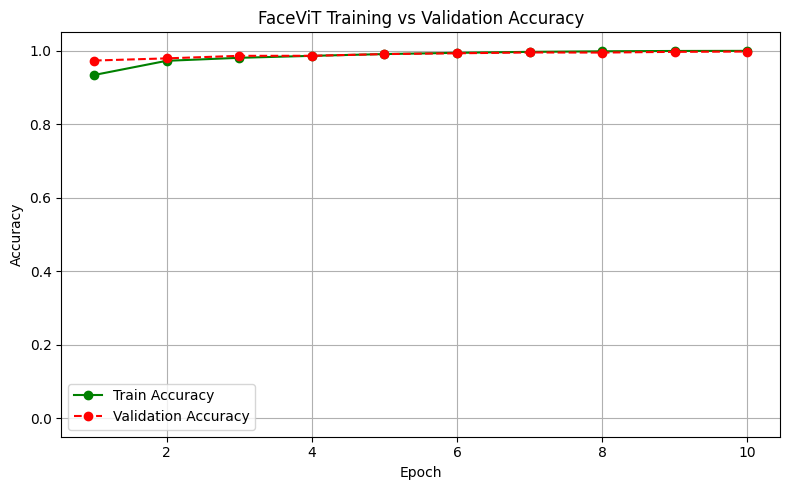

Loss plot saved to /kaggle/working/plots/plot2/loss_plot.png


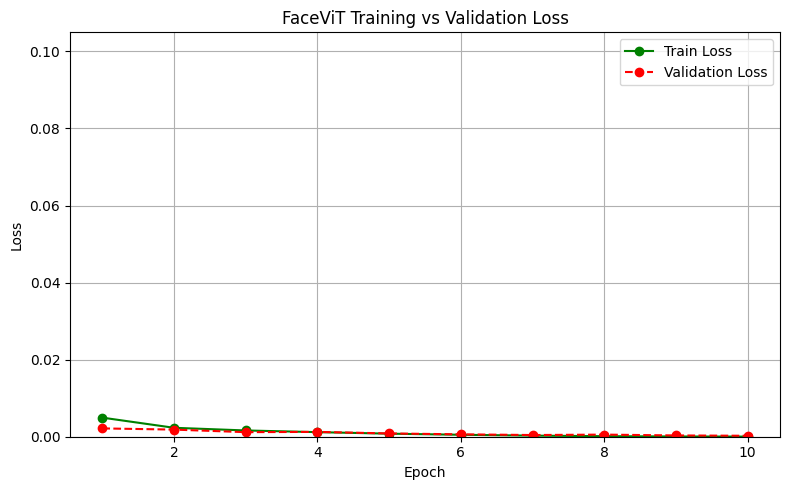

Index(['epoch', 'train_loss', 'train_accuracy', 'train_f1', 'val_loss',
       'val_accuracy', 'val_f1'],
      dtype='object')


In [134]:
import matplotlib.pyplot as plt
import os

def plot_acc_graphs(df, save_dir=None):
    fig, ax = plt.subplots(figsize=(8, 5))

    ax.plot(df['epoch'], df['train_accuracy'], marker='o', color='green', label='Train Accuracy')
    ax.plot(df['epoch'], df['val_accuracy'], marker='o', linestyle='--', color='red', label='Validation Accuracy')

    ax.set_xlabel('Epoch')
    ax.set_ylabel('Accuracy')
    ax.set_title('FaceViT Training vs Validation Accuracy')
    ax.legend()
    ax.set_ylim(-0.05, 1.05)  # Add padding above and below
    plt.grid(True)
    plt.tight_layout()
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        plot_path = os.path.join(save_dir, 'acc_plot.png')
        plt.savefig(plot_path, dpi=500)
        print(f"Accuracy plot saved to {plot_path}")
    plt.show()

def plot_loss_graphs(df, save_dir=None):
    fig, ax = plt.subplots(figsize=(8, 5))

    ax.plot(df['epoch'], df['train_loss'], marker='o', color='green', label='Train Loss')
    ax.plot(df['epoch'], df['val_loss'], marker='o', linestyle='--', color='red', label='Validation Loss')

    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.set_title('FaceViT Training vs Validation Loss')
    ax.legend()
    ymin = 0
    ymax = max(df['train_loss'].max(), df['val_loss'].max()) + 0.1  # Add top margin
    ax.set_ylim(ymin, ymax)
    plt.grid(True)
    plt.tight_layout()
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        plot_path = os.path.join(save_dir, 'loss_plot.png')
        plt.savefig(plot_path, dpi=500)
        print(f"Loss plot saved to {plot_path}")
    plt.show()
plot_acc_graphs(df, save_dir="/kaggle/working/plots/plot1")
plot_loss_graphs(df, save_dir="/kaggle/working/plots/plot2")
print(df.columns)


In [125]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_true, y_pred, classes, epoch):
    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'FaceViT Model Confusion Matrix (Epoch {epoch + 1})')
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)

    thresh = conf_matrix.max() / 2.0
    for i, j in np.ndindex(conf_matrix.shape):
        plt.text(j, i, conf_matrix[i, j], horizontalalignment="center", color="white" if conf_matrix[i, j] > thresh else "black")

    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

    plt.tight_layout()
    plt.show()

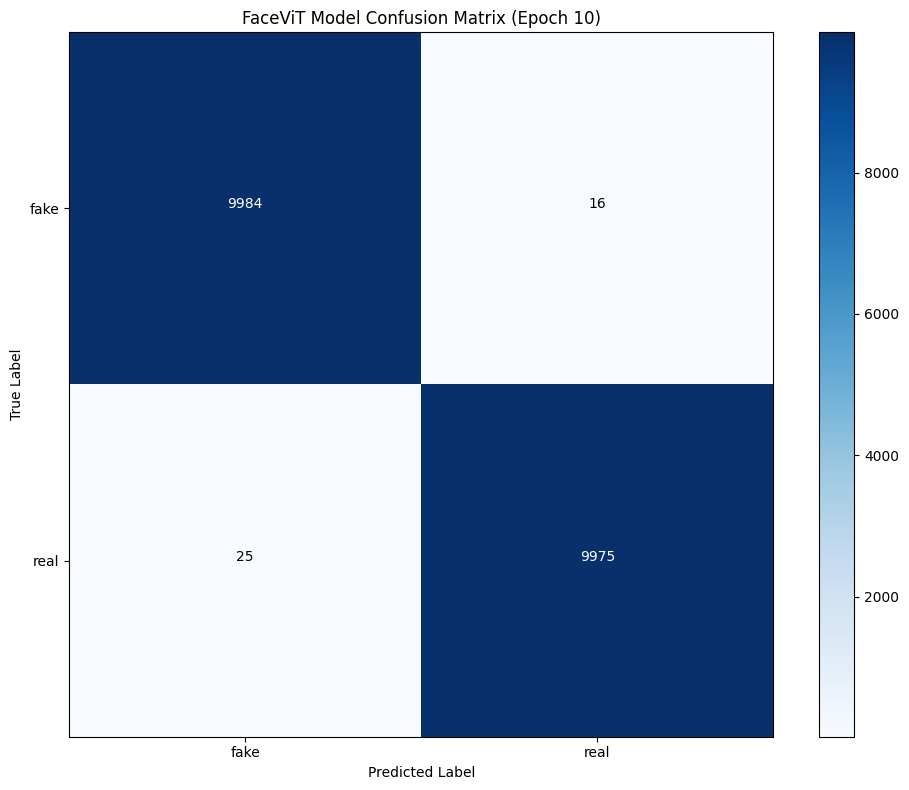

In [126]:
class_names = ['fake', 'real']
num_epochs = 10
#unique_labels = np.unique(val_y_true)
#class_names = [str(label) for label in unique_labels]
plot_confusion_matrix(y_true, y_pred, class_names, num_epochs - 1)

In [135]:
from sklearn.metrics import classification_report
# Print training metrics
print(f"Training Loss: {train_loss}")
print(f"Training Accuracy: {train_accuracy}")
print(f"Training F1 Score: {train_f1}")

# Print testing metrics
print(f"Testing Loss: {test_loss}")
print(f"Testing Accuracy: {test_accuracy}")
print(f"Testing F1 Score: {test_f1}")

# Generate classification report
report = classification_report(y_true, y_pred, target_names=['fake', 'real'])

print("")
print("Classification Report:")
print(report)

Training Loss: 3.1953464461847716e-05
Training Accuracy: 0.9996
Training F1 Score: 0.9995999999993599
Testing Loss: 0.00022496869445534458
Testing Accuracy: 0.99795
Testing F1 Score: 0.9979499995848748

Classification Report:
              precision    recall  f1-score   support

        fake       1.00      1.00      1.00     10000
        real       1.00      1.00      1.00     10000

    accuracy                           1.00     20000
   macro avg       1.00      1.00      1.00     20000
weighted avg       1.00      1.00      1.00     20000



Plot saved to /Volumes/DSWiz/DeepFake/archive/aucroc_plot.png


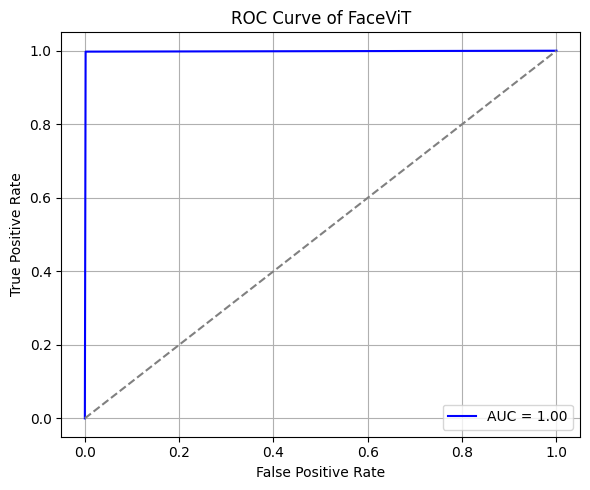

In [128]:
from sklearn.metrics import roc_curve, auc
def plot_auc_roc(y_true, y_pred, save_dir=None):
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.2f}', color='blue')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve of FaceViT')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        plot_path = os.path.join(save_dir, 'aucroc_plot.png')
        plt.savefig(plot_path, dpi = 500)
        print(f"Plot saved to {plot_path}")
    plt.show()

plot_auc_roc(y_true, y_pred, save_dir = "/Volumes/DSWiz/DeepFake/archive")

In [129]:
df.to_csv('Metrics.csv', index = False)
df_test.to_csv('Test_Metrics.csv', index = False)

In [130]:
from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score, 
    log_loss, brier_score_loss, cohen_kappa_score
)
import numpy as np

def evaluate_metrics(y_true, y_pred_probs, threshold=0.5):
    y_pred_probs = np.array(y_pred_probs)
    y_true = np.array(y_true)

    y_pred = (y_pred_probs >= threshold).astype(int)

    metrics = {
        'Accuracy': accuracy_score(y_true, y_pred),
        'F1 Score': f1_score(y_true, y_pred),
        'ROC AUC': roc_auc_score(y_true, y_pred_probs),
        'Log Loss': log_loss(y_true, y_pred_probs),
        'Brier Score': brier_score_loss(y_true, y_pred_probs),
        'Cohen\'s Kappa': cohen_kappa_score(y_true, y_pred),
    }

    for k, v in metrics.items():
        print(f"{k}: {v:.4f}")

    return metrics

evaluate_metrics(y_true, y_pred, threshold=0.5)

Accuracy: 0.9980
F1 Score: 0.9979
ROC AUC: 0.9979
Log Loss: 0.0739
Brier Score: 0.0021
Cohen's Kappa: 0.9959


{'Accuracy': 0.99795,
 'F1 Score': 0.9979490770846882,
 'ROC AUC': 0.9979499999999999,
 'Log Loss': 0.07388948944769037,
 'Brier Score': 0.00205,
 "Cohen's Kappa": 0.9959}

Plot saved to /Volumes/DSWiz/DeepFake/archive/reliable_plot.png


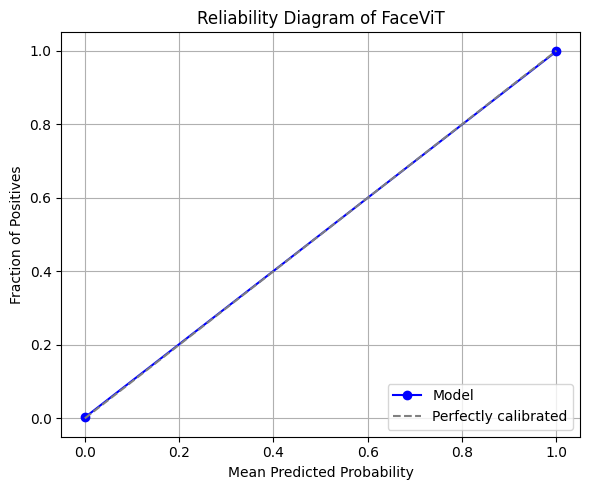

In [131]:
from sklearn.calibration import calibration_curve

def plot_reliability_diagram(y_true, y_pred_probs, n_bins=10, save_dir=None):
    # Compute the calibration curve
    fraction_of_positives, mean_predicted_value = calibration_curve(y_true, y_pred_probs, n_bins=n_bins)

    # Plot the reliability diagram
    plt.figure(figsize=(6, 5))
    plt.plot(mean_predicted_value, fraction_of_positives, marker='o', label='Model', color='blue')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly calibrated')
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.title('Reliability Diagram of FaceViT')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        plot_path = os.path.join(save_dir, 'reliable_plot.png')
        plt.savefig(plot_path, dpi = 500)
        print(f"Plot saved to {plot_path}")
    plt.show()
plot_reliability_diagram(y_true, y_pred, save_dir = "/Volumes/DSWiz/DeepFake/archive")

 Important libraries for GRAD CAM AND LIME

In [140]:
# Randomly sample 10 real and 10 fake
real = [p for p in test_data.samples if "real" in p[0]]
fake = [p for p in test_data.samples if "fake" in p[0]]
samples = random.sample(real, 10) + random.sample(fake, 10)

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
import random
from PIL import Image
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.models.vision_transformer import vit_b_16, ViT_B_16_Weights
from lime import lime_image
from skimage.segmentation import mark_boundaries
import os

In [147]:
# === Load the trained FaceViT model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = vit_b_16(weights=None)
model.heads = torch.nn.Linear(768, 2)  # Binary classification
model.load_state_dict(torch.load("/kaggle/working/model/best_model_vit_exp_2.pth", map_location=device))
model.to(device)
model.eval()

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [148]:
# === Load Test Dataset ===
transform = ViT_B_16_Weights.IMAGENET1K_V1.transforms()
dataset = ImageFolder("/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/test", transform=transform)

In [161]:
# === Register hooks and compute Grad-CAM on CLS token ===
def generate_gradcam_vit_cls(model, img_tensor):
    activations = {}
    gradients = {}

    def forward_hook(module, input, output):
        activations["value"] = output

    def backward_hook(module, grad_input, grad_output):
        gradients["value"] = grad_output[0]

    # Hook the last encoder layer (12th block for ViT-B/16)
    handle_fwd = model.encoder.layers[-1].register_forward_hook(forward_hook)
    handle_bwd = model.encoder.layers[-1].register_full_backward_hook(backward_hook)

    model.eval()
    img_tensor = img_tensor.unsqueeze(0).to(device).requires_grad_()

    # Forward pass
    output = model(img_tensor)
    pred_class = output.argmax(dim=1).item()
    class_score = output[0, pred_class]

    # Backward pass
    model.zero_grad()
    class_score.backward()

    # Remove hooks
    handle_fwd.remove()
    handle_bwd.remove()

    # Extract values
    act = activations["value"].detach()  # shape: [1, seq_len, hidden_dim]
    grad = gradients["value"].detach()   # shape: [1, seq_len, hidden_dim]

    # Focus on CLS token (index 0)
    weights = grad[:, 0, :]  # shape: [1, hidden_dim]
    cls_act = act[:, 0, :]   # shape: [1, hidden_dim]

    # Grad-CAM: dot product of gradients and activations for CLS token
    cam = (weights * cls_act).squeeze().cpu().numpy()
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    # Fake spatial map reshape + upscale for visualization
    cam = cam.reshape(32, 24)
    cam = cv2.resize(cam, (224, 224))

    return cam, pred_class


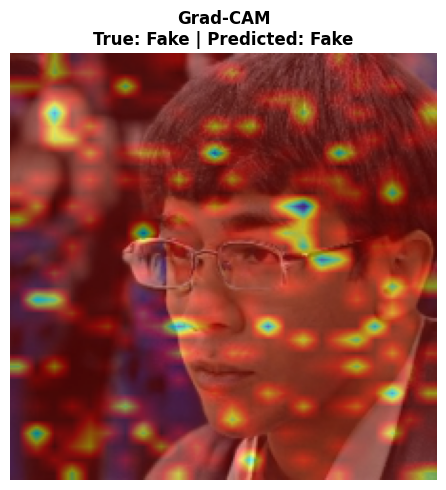

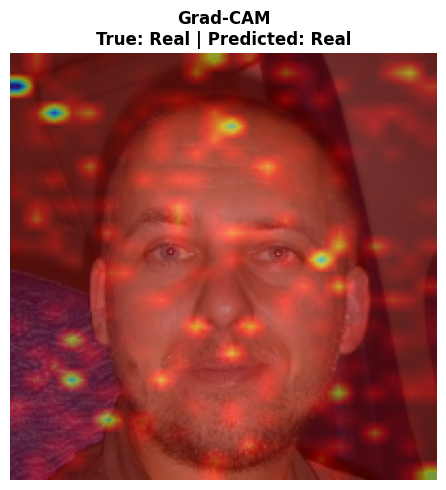

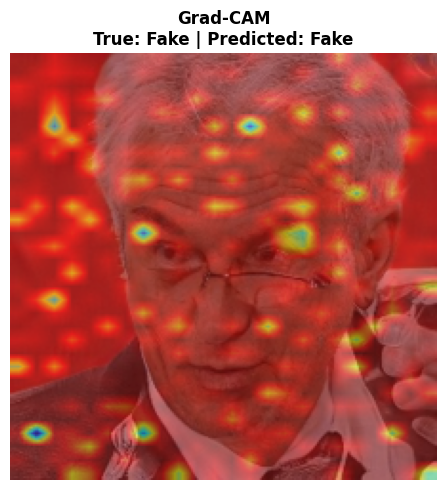

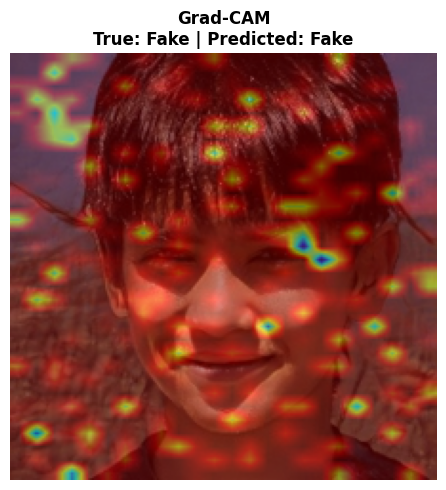

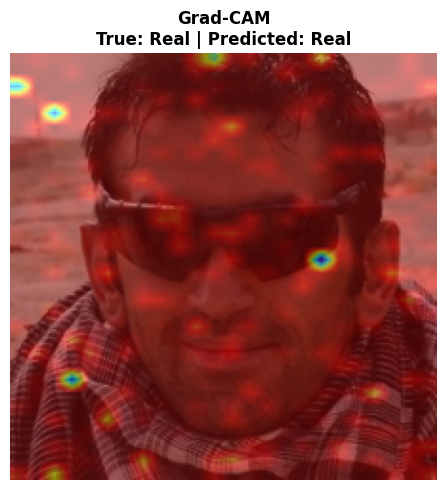

...

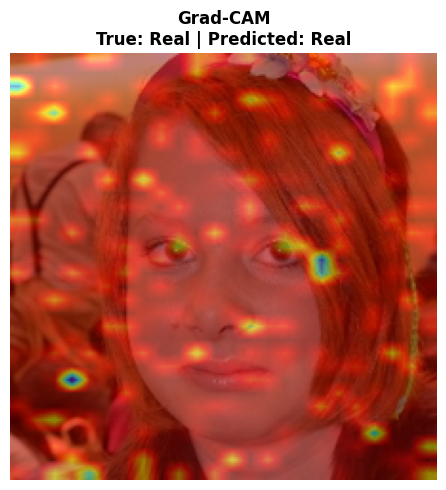

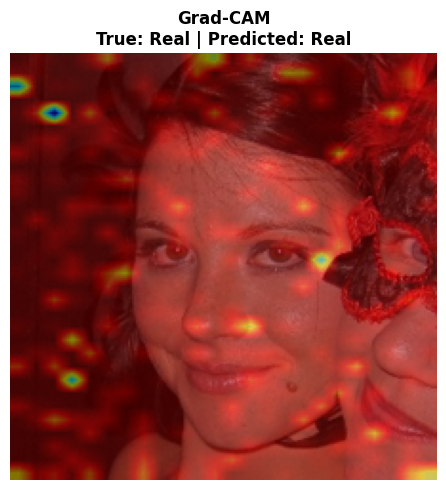

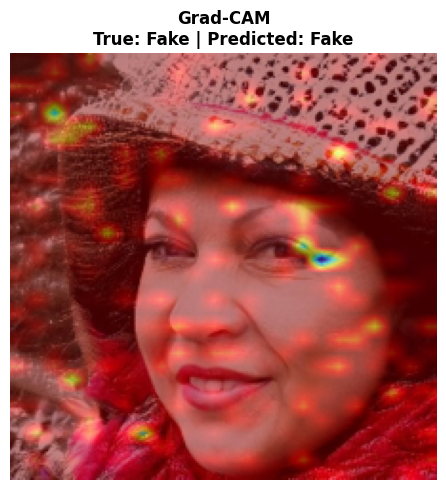

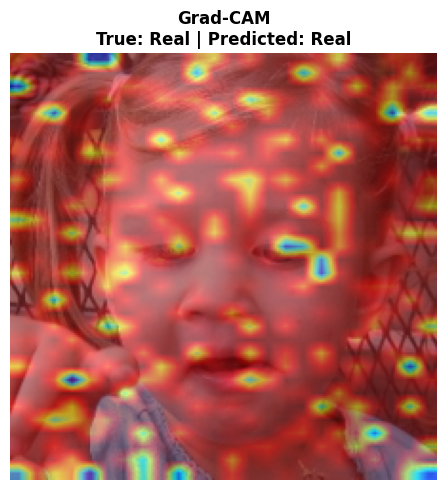

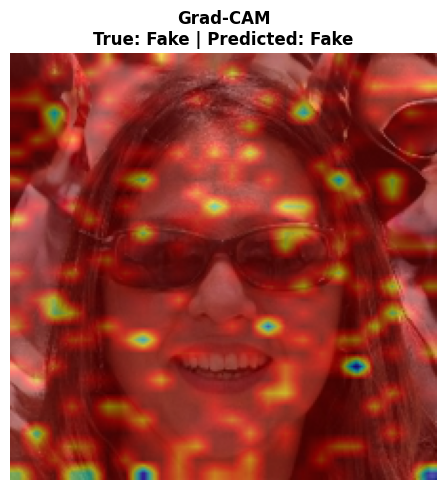

In [157]:
# === Setup class names and output directory ===
class_names = ['Fake', 'Real']
os.makedirs("/kaggle/working/explanations/gradcam", exist_ok=True)

# === Grad-CAM Visualization Loop ===
for i, ((raw, tensor), (_, label)) in enumerate(zip(zip(raw_images, tensor_images), samples)):
    cam, pred_class = generate_gradcam(tensor, model)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(np.array(raw.resize((224, 224))), 0.5, heatmap, 0.5, 0)

    # Create figure
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(overlay)
    ax.set_title(
        f"Grad-CAM\nTrue: {class_names[label]} | Predicted: {class_names[pred_class]}",
        fontsize=12,
        fontweight='bold'
    )
    ax.axis('off')
    plt.tight_layout()

    # Save with high resolution
    plt.savefig(f"/kaggle/working/explanations/gradcam/gradcam_{i+1}.png", dpi=500)
    plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

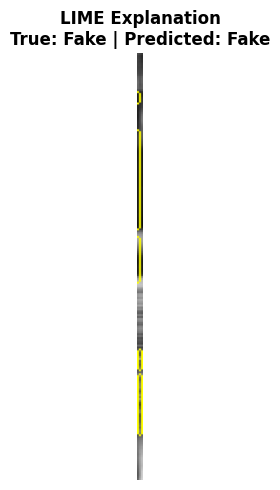

  0%|          | 0/1000 [00:00<?, ?it/s]

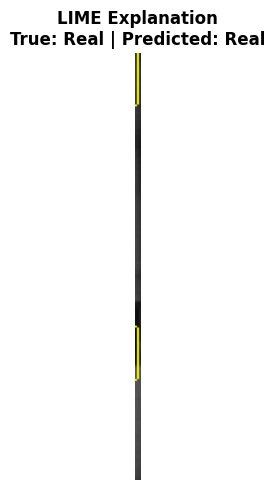

  0%|          | 0/1000 [00:00<?, ?it/s]

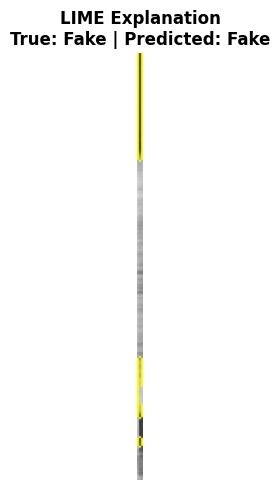

  0%|          | 0/1000 [00:00<?, ?it/s]

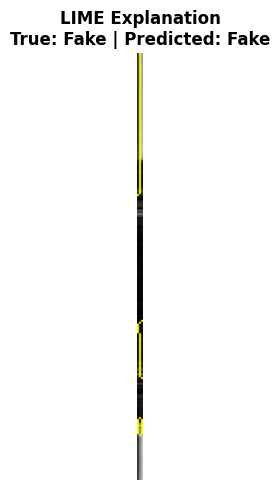

  0%|          | 0/1000 [00:00<?, ?it/s]

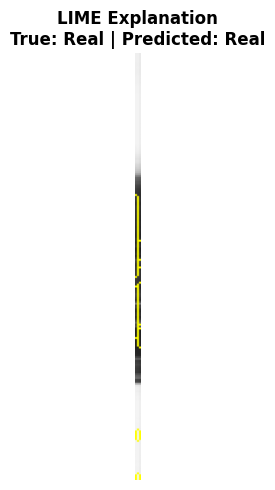

  0%|          | 0/1000 [00:00<?, ?it/s]

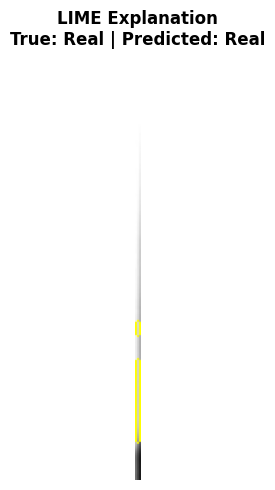

  0%|          | 0/1000 [00:00<?, ?it/s]

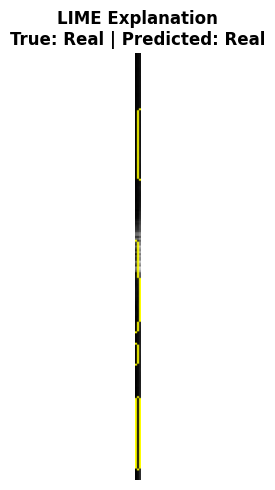

  0%|          | 0/1000 [00:00<?, ?it/s]

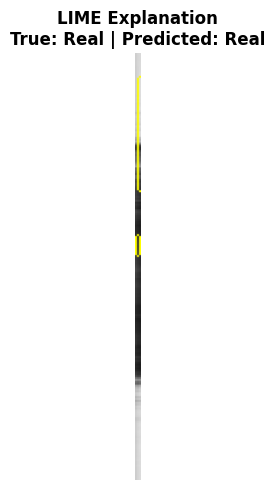

  0%|          | 0/1000 [00:00<?, ?it/s]

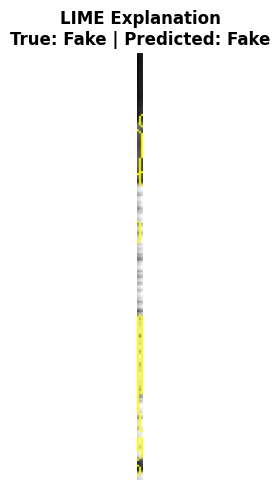

  0%|          | 0/1000 [00:00<?, ?it/s]

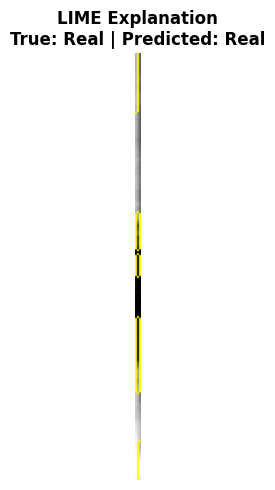

  0%|          | 0/1000 [00:00<?, ?it/s]

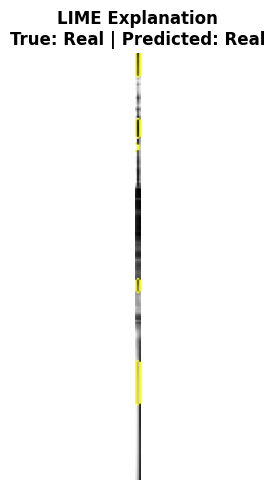

  0%|          | 0/1000 [00:00<?, ?it/s]

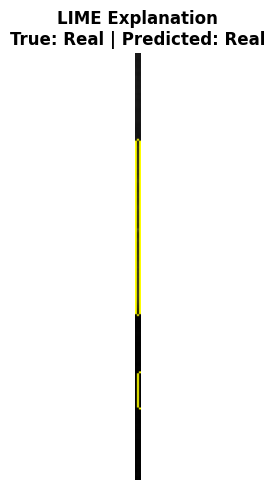

  0%|          | 0/1000 [00:00<?, ?it/s]

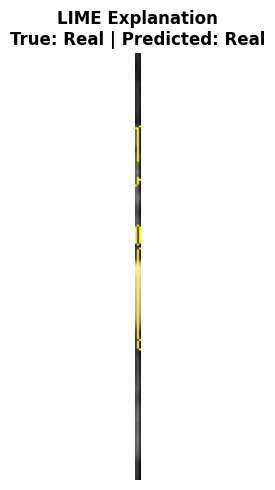

  0%|          | 0/1000 [00:00<?, ?it/s]

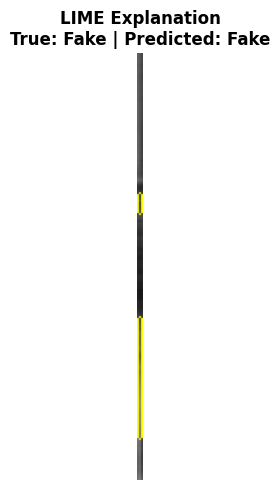

  0%|          | 0/1000 [00:00<?, ?it/s]

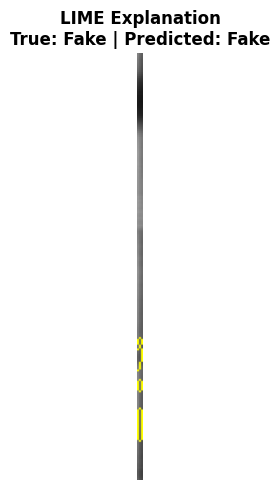

  0%|          | 0/1000 [00:00<?, ?it/s]

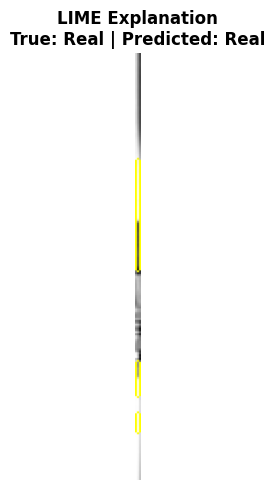

  0%|          | 0/1000 [00:00<?, ?it/s]

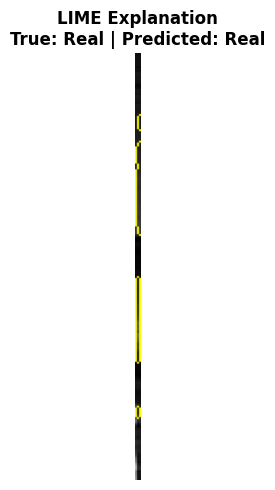

  0%|          | 0/1000 [00:00<?, ?it/s]

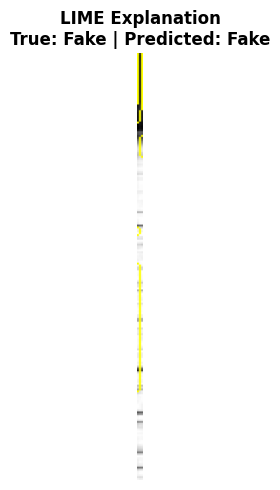

  0%|          | 0/1000 [00:00<?, ?it/s]

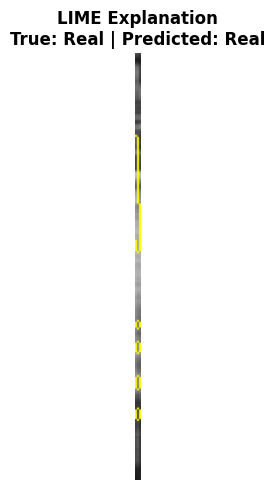

  0%|          | 0/1000 [00:00<?, ?it/s]

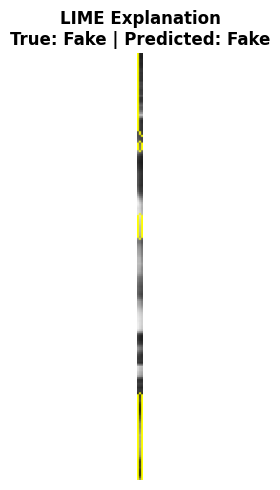

In [169]:
from lime import lime_image
from skimage.segmentation import mark_boundaries, slic
from skimage.transform import resize
import matplotlib.pyplot as plt
import os
import numpy as np

# Custom segmentation function using slic (compact square regions)
def custom_segmentation_fn(image):
    return slic(image, n_segments=50, compactness=10, sigma=1)

# Setup
class_names = ['Fake', 'Real']
lime_output_dir = "/kaggle/working/explanations/limeS"
os.makedirs(lime_output_dir, exist_ok=True)

# Recreate LIME explainer with custom segmentation
explainer = lime_image.LimeImageExplainer()

# Visualization loop
for i, (raw, (_, true_label)) in enumerate(zip(raw_images, samples)):
    raw_resized = raw.resize((224, 224))
    img_array = np.array(raw_resized.convert("RGB"))

    explanation = explainer.explain_instance(
        img_array,
        classifier_fn=predict_fn,
        top_labels=1,
        hide_color=0,
        num_samples=1000,
        segmentation_fn=custom_segmentation_fn
    )

    lime_img, lime_mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        hide_rest=False
    )
    pred_class = explanation.top_labels[0]

    if lime_mask.shape != lime_img[0].shape[:2]:
        lime_mask = resize(lime_mask, lime_img[0].shape[:2], preserve_range=True, anti_aliasing=False).astype(bool)

    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(mark_boundaries(lime_img[0], lime_mask))
    ax.set_title(
        f"LIME Explanation\nTrue: {class_names[true_label]} | Predicted: {class_names[pred_class]}",
        fontsize=12,
        fontweight='bold'
    )
    ax.axis('off')
    plt.tight_layout()

    plt.savefig(f"{lime_output_dir}/lime_{i+1}.png", dpi=500)
    plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

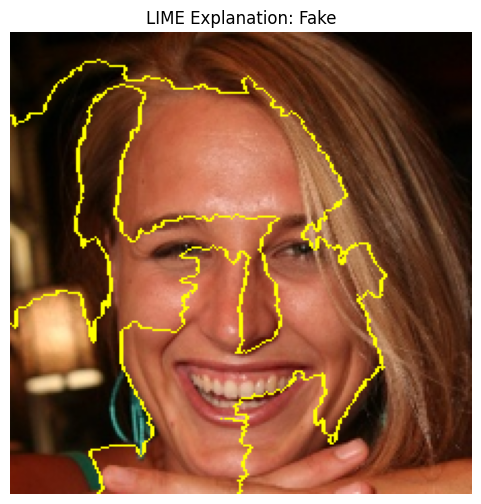

  0%|          | 0/1000 [00:00<?, ?it/s]

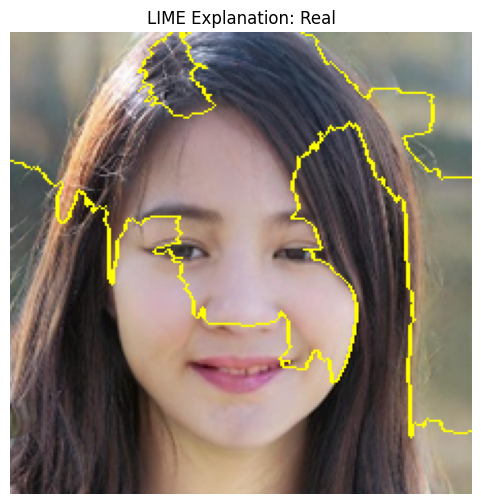

In [180]:
import torch
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from lime import lime_image
from torchvision import transforms
from skimage.segmentation import mark_boundaries

# Initialize LIME Explainer
explainer = lime_image.LimeImageExplainer()

# Define the preprocessing transform (same as model's train/test transforms)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# LIME-compatible prediction function
def predict_fn(images_np):
    model.eval()
    images_tensor = torch.stack([transform(Image.fromarray(img)) for img in images_np]).to(device)
    outputs = model(images_tensor)
    probs = torch.nn.functional.softmax(outputs, dim=1)
    return probs.detach().cpu().numpy()

# Function to generate and display LIME explanation
def explain_image_with_lime(img_path, label_name=""):
    img = Image.open(img_path).convert("RGB").resize((224, 224))
    img_np = np.array(img)

    explanation = explainer.explain_instance(
        img_np,
        predict_fn,
        top_labels=1,
        hide_color=0,
        num_samples=1000
    )

    # Get explanation mask for top class
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=10,
        hide_rest=False
    )

    # Overlay mask on image
    lime_img = mark_boundaries(temp / 255.0, mask)

    plt.figure(figsize=(6, 6))
    plt.title(f"LIME Explanation: {label_name}")
    plt.imshow(lime_img)
    plt.axis('off')
    plt.show()

# Example usage:
real_img_path = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/test/fake/00276TOPP4.jpg" #fake
fake_img_path = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/test/real/00001.jpg"
explain_image_with_lime(fake_img_path, label_name="Fake")
explain_image_with_lime(real_img_path, label_name="Real")



Generating LIME explanations for Real images...


  0%|          | 0/1000 [00:00<?, ?it/s]

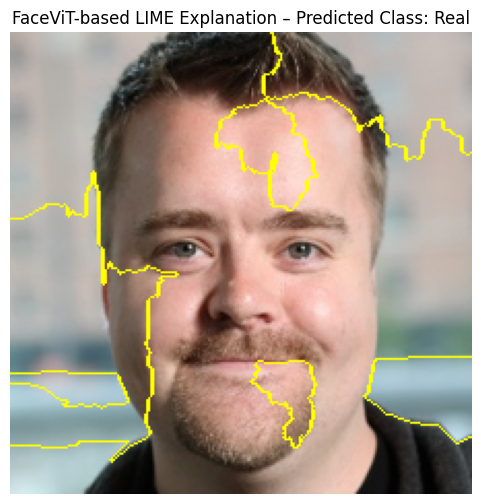

  0%|          | 0/1000 [00:00<?, ?it/s]

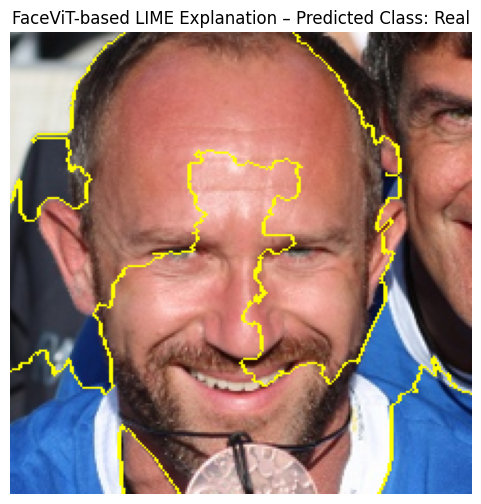

  0%|          | 0/1000 [00:00<?, ?it/s]

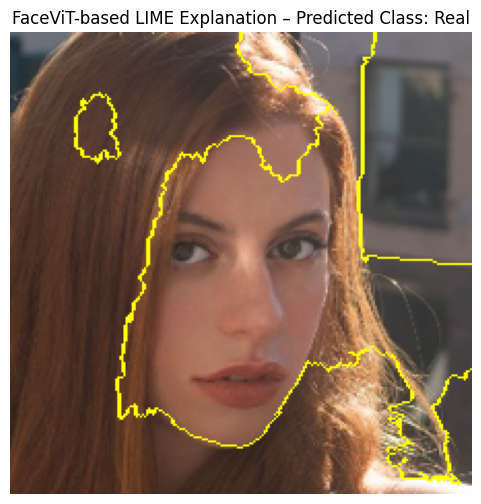

  0%|          | 0/1000 [00:00<?, ?it/s]

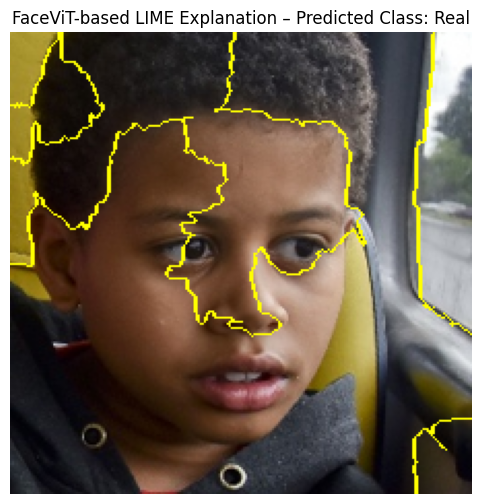

  0%|          | 0/1000 [00:00<?, ?it/s]

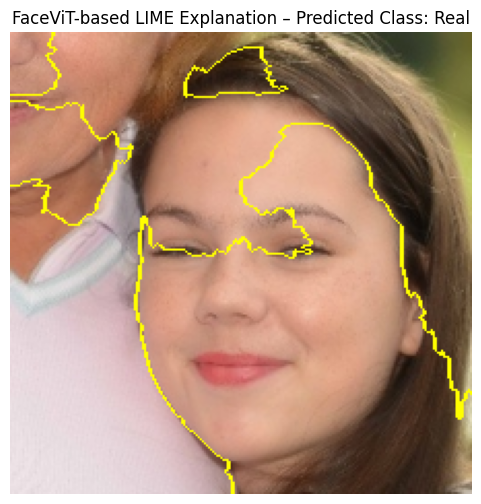

  0%|          | 0/1000 [00:00<?, ?it/s]

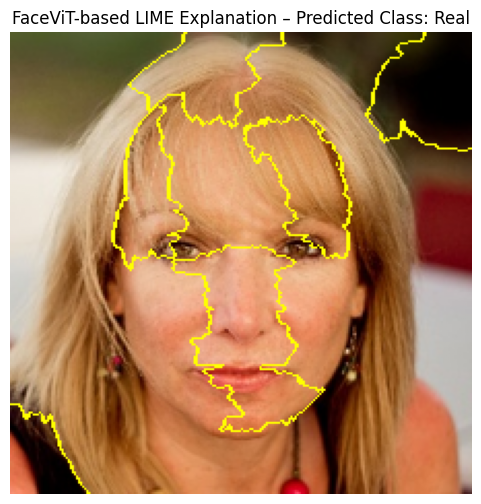

  0%|          | 0/1000 [00:00<?, ?it/s]

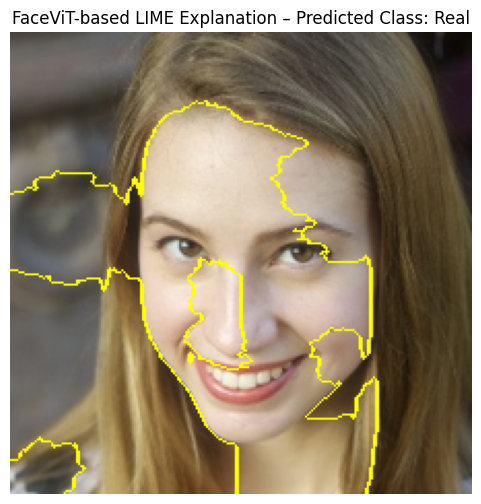

  0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
import os
import random
import matplotlib.pyplot as plt

# Output directories
output_base = "/kaggle/working/lime_last"
output_real = os.path.join(output_base, "real")
output_fake = os.path.join(output_base, "fake")

# Create output folders if not exist
os.makedirs(output_real, exist_ok=True)
os.makedirs(output_fake, exist_ok=True)

# Function to get random N images from a folder
def get_random_images(folder_path, n=10):
    all_images = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png'))]
    selected_images = random.sample(all_images, min(n, len(all_images)))
    return [os.path.join(folder_path, f) for f in selected_images]

# Predict the label
def get_predicted_label(img_path):
    img = Image.open(img_path).convert("RGB").resize((224, 224))
    img_tensor = transform(img).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(img_tensor)
        probs = torch.nn.functional.softmax(output, dim=1)
        pred_idx = torch.argmax(probs, dim=1).item()
    label = "Real" if pred_idx == 1 else "Fake"
    return label

# Explain and save LIME output
def explain_and_save(img_path, save_dir):
    img = Image.open(img_path).convert("RGB").resize((224, 224))
    img_np = np.array(img)

    predicted_label = get_predicted_label(img_path)

    explanation = explainer.explain_instance(
        img_np,
        predict_fn,
        top_labels=1,
        hide_color=0,
        num_samples=1000
    )

    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=10,
        hide_rest=False
    )

    lime_img = mark_boundaries(temp / 255.0, mask)

    # Plot and save
    plt.figure(figsize=(6, 6))
    plt.imshow(lime_img)
    plt.axis('off')
    title = f"FaceViT-based LIME Explanation – Predicted Class: {predicted_label}"

    plt.title(title)
    save_path = os.path.join(save_dir, title.replace(".jpg", "_lime.jpg"))
    plt.savefig(save_path, bbox_inches='tight')
    plt.show()
    plt.close()

# Paths to datasets
real_folder = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/test/real"
fake_folder = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/test/fake"

# Number of images per class
N = 10

# Process real and fake
real_images = get_random_images(real_folder, N)
fake_images = get_random_images(fake_folder, N)

print("Generating LIME explanations for Real images...")
for path in real_images:
    explain_and_save(path, output_real)

print("Generating LIME explanations for Fake images...")
for path in fake_images:
    explain_and_save(path, output_fake)

print("✅ LIME visualizations saved to:", output_base)
